## xG-model trained and tested on womens data

In [2]:
import pandas as pd
import numpy as np

damallsvenskan = pd.read_csv('csv/damallsvenskan_all.csv')
player_positions = pd.read_csv('csv/player_positions.csv', dtype={'Player Name': str, 'Mean X-Position': np.float64, 'Mean Y-Position': np.float64, 'Event Amount': np.int64, 'Position': str, 'Role': str})
import pandas as pd
from sklearn import metrics

## Creating the features for the dataset

In [3]:
import math
data = []

width = 7.32

damallsvenskan = damallsvenskan[damallsvenskan['penalty'] == False] 

def calculate_angle(x, y):
    scaled_x = x * 1.2
    scaled_y = y * 0.8

    g0 = [120, 44]
    p = [scaled_x, scaled_y]
    g1 = [120, 36]

    v0 = np.array(g0) - np.array(p)
    v1 = np.array(g1) - np.array(p)

    angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))
    return(abs(np.degrees(angle)))

def calculate_dist (x ,y):
    scaled_x = (x * 1.2) - 120
    scaled_y = (y * 0.8) - 40
    dist = np.sqrt(np.power(scaled_x,2) + np.power(scaled_y,2))
    return dist


def shot_in_box (x , y):
    scaled_x = x * 1.2
    scaled_y = y * 0.8
    if ((103.5 < scaled_x ) and (19.9 < scaled_y ) and (scaled_y < 59.9)):
        return True
    else:
        return False

def pass_length (x1, y1 , x2, y2):
    scaled_x1 = x1 *1.2
    scaled_x2 = x2 * 1.2
    scaled_y1 = y1 * 0.8
    scaled_y2 = y2 * 0.8
    pl = np.sqrt((scaled_x1 - scaled_x2)**2 + (scaled_y1 - scaled_y2)**2)
    return pl



for i in range(len(damallsvenskan) - 1):
    if damallsvenskan.iloc[i]['action'] == 'Shot' and damallsvenskan.iloc[i+1]['action'] != 'Goal':
        player = damallsvenskan.iloc[i]['player']
        playerdf = player_positions[player_positions['Player Name'] == player]
        position = playerdf['Role'].values

        if damallsvenskan.iloc[i-1]['action'] == 'Pass accurate':
            data.append({'goal': 0, 
                         'header': damallsvenskan.iloc[i]['header'], 
                         'angle': calculate_angle(damallsvenskan.iloc[i]['xpos'], damallsvenskan.iloc[i]['ypos']), 
                         'distance': calculate_dist(damallsvenskan.iloc[i]['xpos'], damallsvenskan.iloc[i]['ypos']), 
                         'attack-type': damallsvenskan.iloc[i]['attack_type'], 
                         'shot-in-box': shot_in_box(damallsvenskan.iloc[i]['xpos'],damallsvenskan.iloc[i]['ypos']),
                         'player-position': position[0]})
        else:
            data.append({'goal': 0, 
                         'header': damallsvenskan.iloc[i]['header'], 
                         'angle': calculate_angle(damallsvenskan.iloc[i]['xpos'], damallsvenskan.iloc[i]['ypos']),
                         'distance': calculate_dist(damallsvenskan.iloc[i]['xpos'], damallsvenskan.iloc[i]['ypos']),
                         'attack-type': damallsvenskan.iloc[i]['attack_type'],
                         'shot-in-box': shot_in_box(damallsvenskan.iloc[i]['xpos'],damallsvenskan.iloc[i]['ypos']),
                         'player-position': position[0]})
    
    elif damallsvenskan.iloc[i]['action'] == 'Shot' and damallsvenskan.iloc[i+1]['action'] == 'Goal':
        player = damallsvenskan.iloc[i]['player']
        playerdf = player_positions[player_positions['Player Name'] == player]
        position = playerdf['Role'].values
        #if position.size == 0:
        #    position = 'other'
        #print(position[0])
        if damallsvenskan.iloc[i-1]['action'] == 'Pass accurate':   
            data.append({'goal': 1,
                         'header': damallsvenskan.iloc[i]['header'], 
                         'angle': calculate_angle(damallsvenskan.iloc[i]['xpos'], damallsvenskan.iloc[i]['ypos']), 
                         'distance': calculate_dist(damallsvenskan.iloc[i]['xpos'], damallsvenskan.iloc[i]['ypos']), 
                         'attack-type': damallsvenskan.iloc[i]['attack_type'], 
                         'shot-in-box': shot_in_box(damallsvenskan.iloc[i]['xpos'],damallsvenskan.iloc[i]['ypos']),
                         'player-position': position[0]})
        else:
            data.append({'goal': 1,
                         'header': damallsvenskan.iloc[i]['header'], 
                         'angle': calculate_angle(damallsvenskan.iloc[i]['xpos'], damallsvenskan.iloc[i]['ypos']), 
                         'distance': calculate_dist(damallsvenskan.iloc[i]['xpos'], damallsvenskan.iloc[i]['ypos']), 
                         'attack-type': damallsvenskan.iloc[i]['attack_type'], 
                         'shot-in-box': shot_in_box(damallsvenskan.iloc[i]['xpos'],damallsvenskan.iloc[i]['ypos']),
                         'player-position': position[0]})
data = pd.DataFrame(data)
# Separating the features and the target variable 

X = data[['distance','angle', 'header', 'shot-in-box', 'attack-type','player-position']]

Y = data[['goal']]
data.info()



/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_33717/745318899.py:19: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  angle = np.math.atan2(np.linalg.det([v0,v1]),np.dot(v0,v1))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17236 entries, 0 to 17235
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   goal             17236 non-null  int64  
 1   header           17236 non-null  bool   
 2   angle            17236 non-null  float64
 3   distance         17236 non-null  float64
 4   attack-type      6448 non-null   object 
 5   shot-in-box      17236 non-null  bool   
 6   player-position  17065 non-null  object 
dtypes: bool(2), float64(2), int64(1), object(2)
memory usage: 707.1+ KB


In [4]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17236 entries, 0 to 17235
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   distance         17236 non-null  float64
 1   angle            17236 non-null  float64
 2   header           17236 non-null  bool   
 3   shot-in-box      17236 non-null  bool   
 4   attack-type      6448 non-null   object 
 5   player-position  17065 non-null  object 
dtypes: bool(2), float64(2), object(2)
memory usage: 572.4+ KB


## Categorical gradient boosting 

In [5]:
import catboost as cb
from catboost import Pool, CatBoostRegressor
import catboost as cb
import ipywidgets

from xgboost import XGBRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import StratifiedKFold, cross_val_score, cross_validate
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, brier_score_loss
from sklearn.metrics import classification_report

attack_type_mean = data.groupby('attack-type')['goal'].mean()

X['attack-type'] = data['attack-type'].map(attack_type_mean)

player_positions_mean = data.groupby('player-position')['goal'].mean()

# Step 2: Map the mean values to the corresponding categories
X['player-position'] = data['player-position'].map(player_positions_mean)





X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size=0.2, random_state=42, shuffle=True)

train_pool = Pool(X_train, 
                  y_train)

test_pool = Pool(X_test,y_test)


model = cb.CatBoostRegressor(loss_function='RMSE')






grid = {'iterations': [100, 150, 200, 250, 300],
        'learning_rate': [0.03, 0.1, 0.01, 0.15],
        'depth': [2, 4, 6, 8, 10],
        'l2_leaf_reg': [0.2, 0.5, 1, 3, 5]}


result = model.grid_search(grid, train_pool, plot=True)

feature_importance = model.get_feature_importance()



pred = model.predict(X_test)

print(result['params'])


/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_33717/3230864491.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['attack-type'] = data['attack-type'].map(attack_type_mean)
/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_33717/3230864491.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['player-position'] = data['player-position'].map(player_positions_mean)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.3265182	test: 0.3183242	best: 0.3183242 (0)	total: 61.4ms	remaining: 6.07s
1:	learn: 0.3249133	test: 0.3169243	best: 0.3169243 (1)	total: 62.6ms	remaining: 3.07s
2:	learn: 0.3233418	test: 0.3156284	best: 0.3156284 (2)	total: 63.3ms	remaining: 2.05s
3:	learn: 0.3218612	test: 0.3143206	best: 0.3143206 (3)	total: 63.9ms	remaining: 1.53s
4:	learn: 0.3205520	test: 0.3131081	best: 0.3131081 (4)	total: 64.5ms	remaining: 1.22s
5:	learn: 0.3192692	test: 0.3120049	best: 0.3120049 (5)	total: 65ms	remaining: 1.02s
6:	learn: 0.3180541	test: 0.3109702	best: 0.3109702 (6)	total: 65.7ms	remaining: 872ms
7:	learn: 0.3168924	test: 0.3099780	best: 0.3099780 (7)	total: 66.4ms	remaining: 763ms
8:	learn: 0.3157938	test: 0.3090363	best: 0.3090363 (8)	total: 68.2ms	remaining: 689ms
9:	learn: 0.3147166	test: 0.3081410	best: 0.3081410 (9)	total: 68.9ms	remaining: 620ms
10:	learn: 0.3137273	test: 0.3073073	best: 0.3073073 (10)	total: 69.5ms	remaining: 562ms
11:	learn: 0.3127395	test: 0.3065254	best: 

## Calculating the brier score of the model

In [6]:
print("Mean: ", pred.mean())
print("Min :",pred.min())
print("Max :",pred.max())


rmse = (np.sqrt(mean_squared_error(y_test, pred)))
mae = (mean_absolute_error(y_test, pred))
r2 = r2_score(y_test, pred)
print('Testing performance')
print('RMSE: {:.4f}'.format(rmse))
print('R2: {:.4f}'.format(r2))
print('MAE: {:.4f}'.format(mae))

for i in range(len(pred)):
    if pred[i] > 1:
        pred[i] = 1
    if pred[i] < 0:
        pred[i] = 0

brier_score = brier_score_loss(y_test, pred)
print('Brier score: {:.4f}'.format(brier_score))


for i , feature_name in enumerate(X_train.columns):
    print(f'Feature {feature_name}, importance: {feature_importance[i]}')

fpr, tpr, thresholds = metrics.roc_curve(y_test, pred, pos_label=1)
print("AUC: ", metrics.auc(fpr, tpr))

Mean:  0.10774153374830514
Min : 0.006435846633083567
Max : 0.6869323164932966
Testing performance
RMSE: 0.2917
R2: 0.1136
MAE: 0.1713
Brier score: 0.0851
Feature distance, importance: 25.02939101084737
Feature angle, importance: 34.996495925374546
Feature header, importance: 15.021872575314841
Feature shot-in-box, importance: 3.592562865754903
Feature attack-type, importance: 14.276606115789404
Feature player-position, importance: 7.083071506918942
AUC:  0.7626306646916038


## Calibration curve

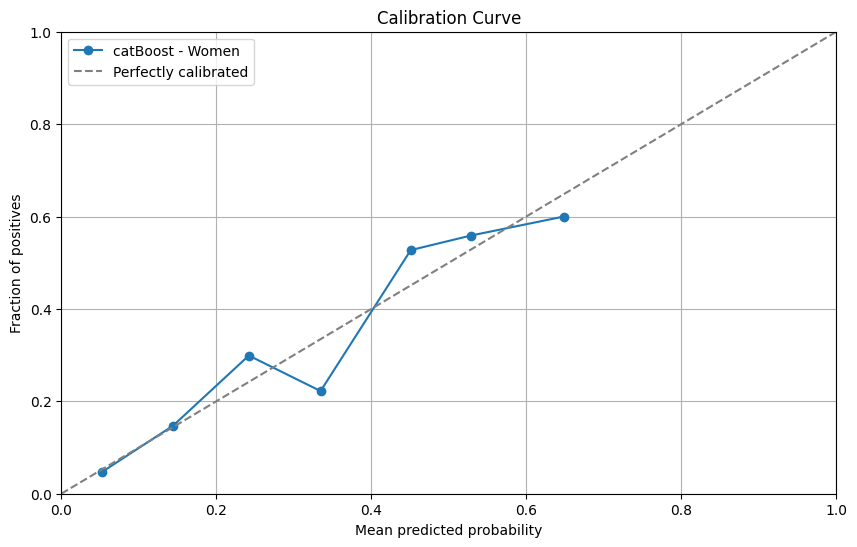

In [7]:
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve

# Assuming you have already trained your XGBoost regressor and made predictions y_pred
# Also assuming you have true labels y_test

# Generate calibration curve
prob_true, prob_pred = calibration_curve(y_test, pred, n_bins=10)

# Plot calibration curve
plt.figure(figsize=(10, 6))
plt.plot(prob_pred, prob_true, marker='o', linestyle='-', label='catBoost - Women')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfectly calibrated')
plt.xlabel('Mean predicted probability')
plt.ylabel('Fraction of positives')
plt.xlim(0,1)
plt.ylim(0,1)
plt.title('Calibration Curve')
plt.legend()
plt.grid(True)
plt.show()


## SHAP

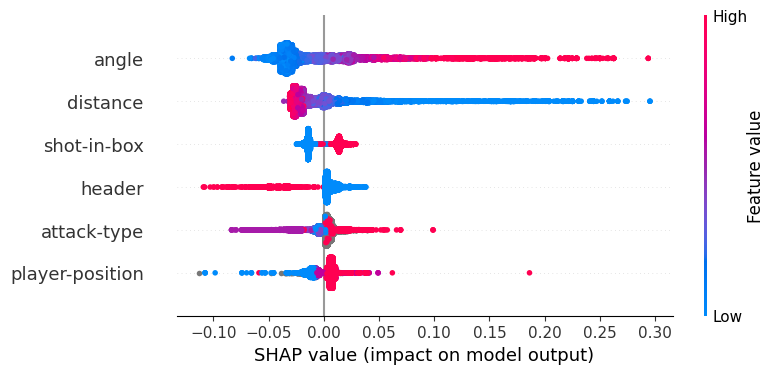

In [8]:
import shap

shap.initjs()
explainer = shap.TreeExplainer(model)
shap_values = explainer(X)
shap.plots.beeswarm(shap_values)

## Pie plot of the feature importance

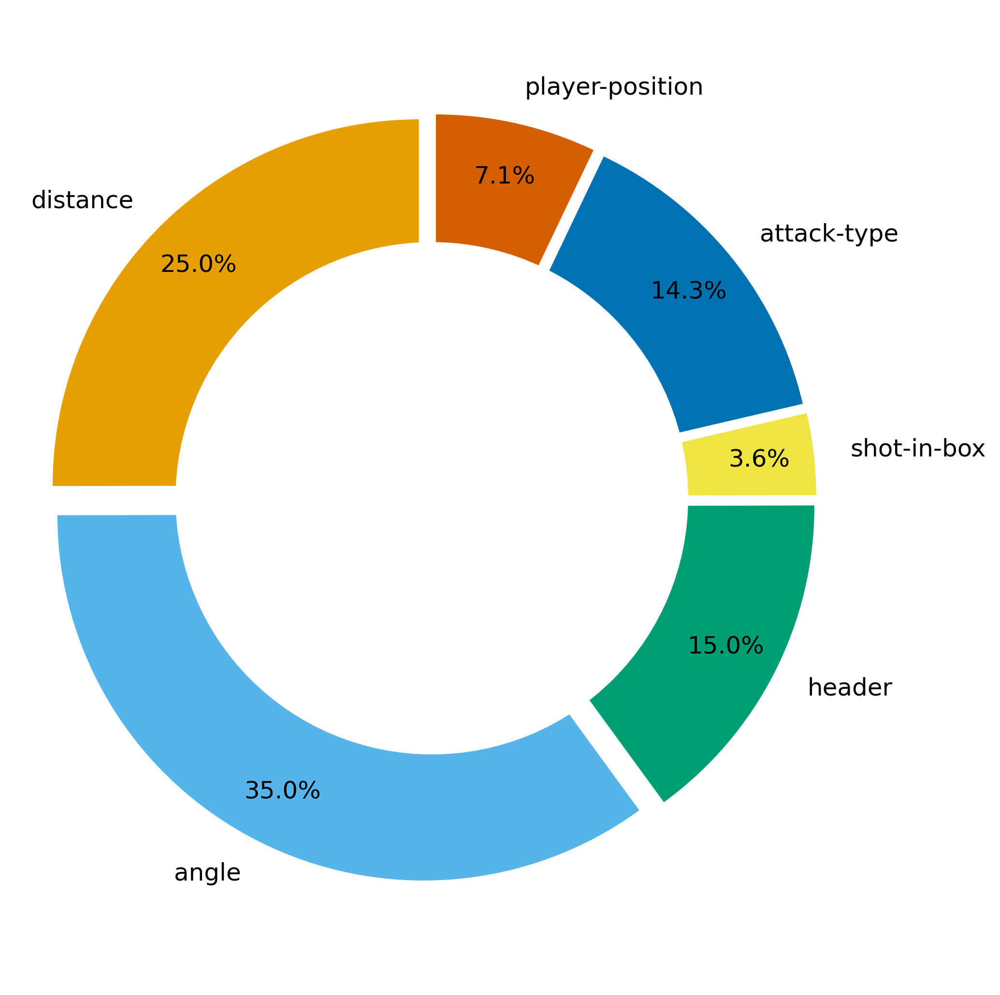

In [24]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300


labels = []
fi = []
for i , feature_name in enumerate(X_train.columns):
    labels.append(feature_name)
    fi.append(feature_importance[i])


fig, ax1 = plt.subplots(figsize = (7,7)) 
#colors
colors = ['#E69F00','#56B4E9','#009E73','#F0E442','#0072B2', '#D55E00']
#explsion
explode = (0.05,0.05,0.05,0.05, 0.05, 0.05)
 
plt.pie(fi, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode, textprops={'fontsize': 12})
#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.show()


NameError: name 'ax1' is not defined

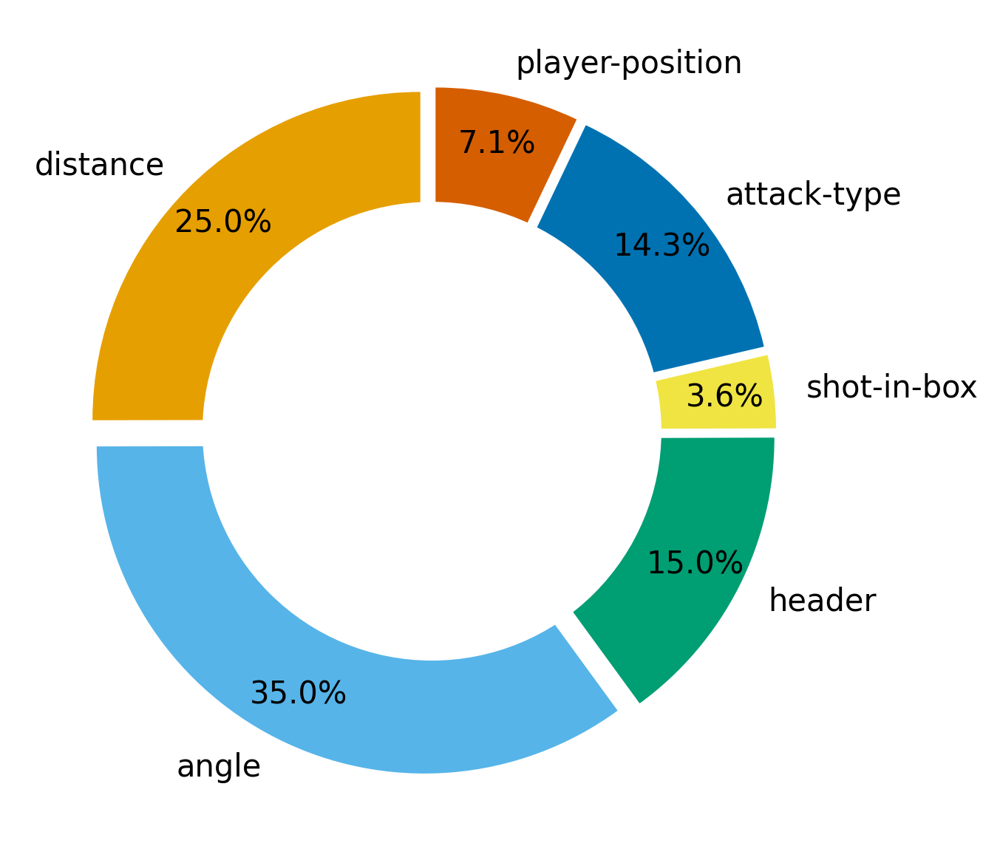